# 5.4  Visualizing what convnets learn

Deep-learning models are “black boxes”: 
- it is difficult to extract learned presentations and present them in a human-readable form.

- partially true for certain types of deep-learning models

- not true for convnets- the learned representations can be visualized

## Some of  the visualizing techniques 

##### 1. Visualizing intermediate convnet outputs (intermediate activations): 
Useful for understanding how successive convnet layers transform their input


##### 2. Visualizing convnets filters:
Useful for understanding precisely what visual pattern or concept each filter in a convnet is receptive to.
 
##### 3.  Visualizing heatmaps of class activation: 
Useful for understanding which parts of an image were identified as belonging to a given class




# 1) Visualizing intermediate activations (feature maps)

Using dogs-versus-cats classification problem in section 5.2.

- displaying the feature maps that are output by various convolution and pooling layers in a network, given a certain input

> model <- load_model_hdf5("cats_and_dogs_small_2.h5")

In [122]:
from keras.models import load_model
model = load_model('cats_and_dogs_small_2.h5')
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 17, 17, 128)       0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 15, 15, 128)      

### Preprocessing a single image
Input image: a picture of a cat, not part of the images the network was trained on

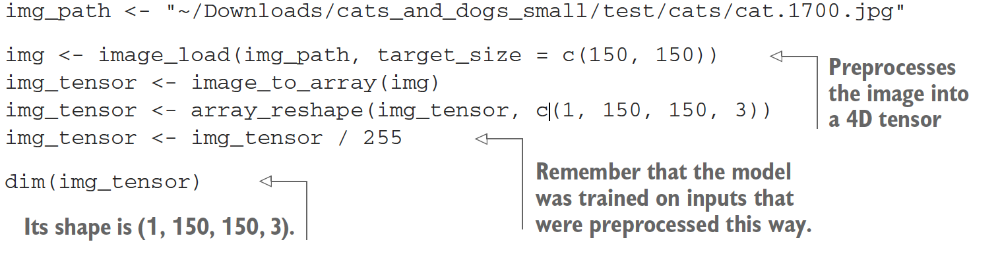

(1, 150, 150, 3)


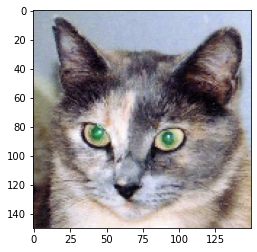

In [11]:
img_path = 'dogs-vs-cats/new/test/cats/cat.1700.jpg'

from keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.

print(img_tensor.shape)
import matplotlib.pyplot as plt
plt.imshow(img_tensor[0])
plt.show()


## Visualizing the feature maps
keras_model function - Functional API, Functional Model

Our model is instantiated using two arguments:
- input tensor (or list of input tensors)
- output tensor (or list of output tensors)

results in - Keras model
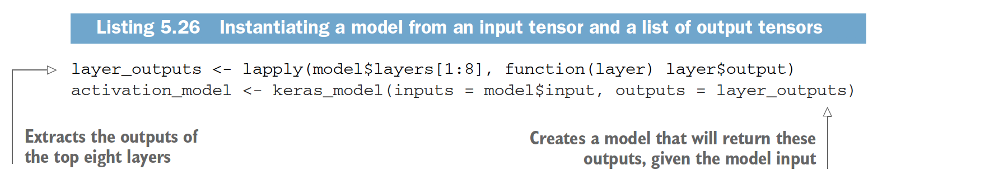
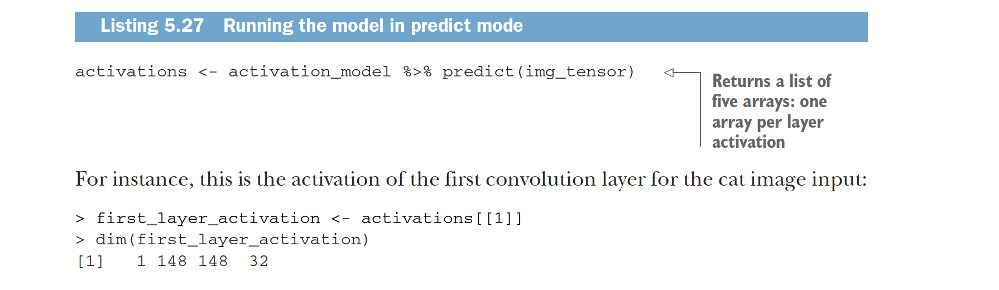

In [125]:
from keras import models
layer_outputs = [layer.output for layer in model.layers[:8]]
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(img_tensor)

### Sample activations from different convolution layer

(1, 7, 7, 128)


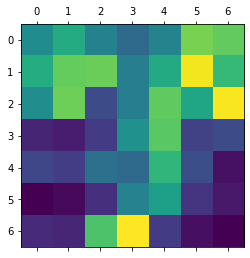

In [130]:
first_layer_activation = activations[7]
print(first_layer_activation.shape)

import matplotlib.pyplot as plt
plt.matshow(first_layer_activation[0, :, :, 0], cmap='viridis')

### Visualizing every channel 

/Users/dativabella/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in true_divide


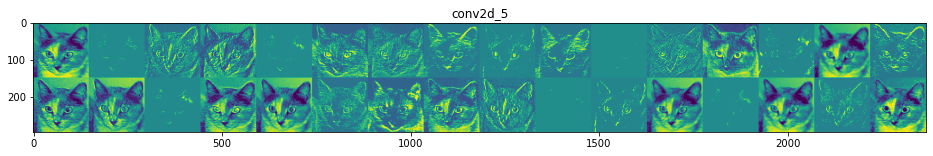

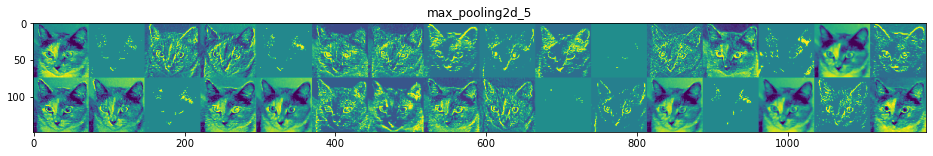

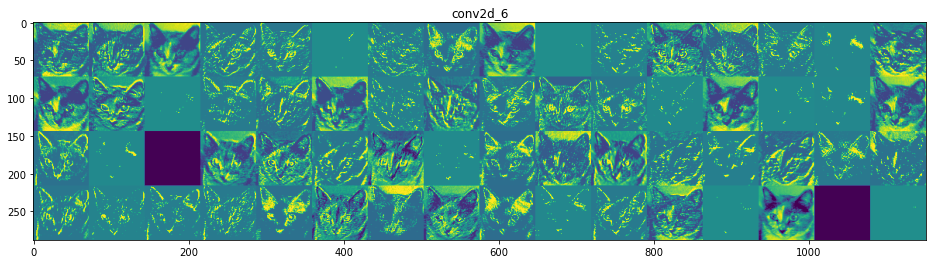

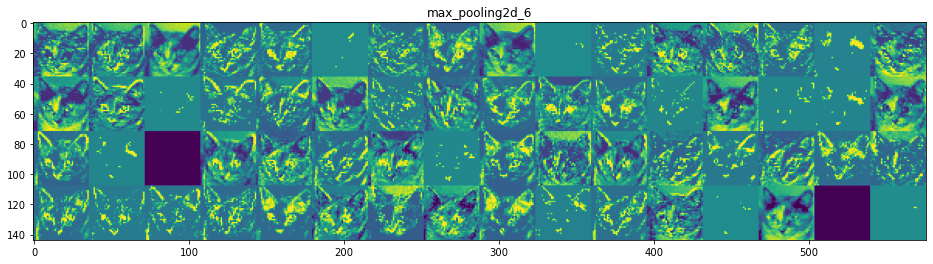

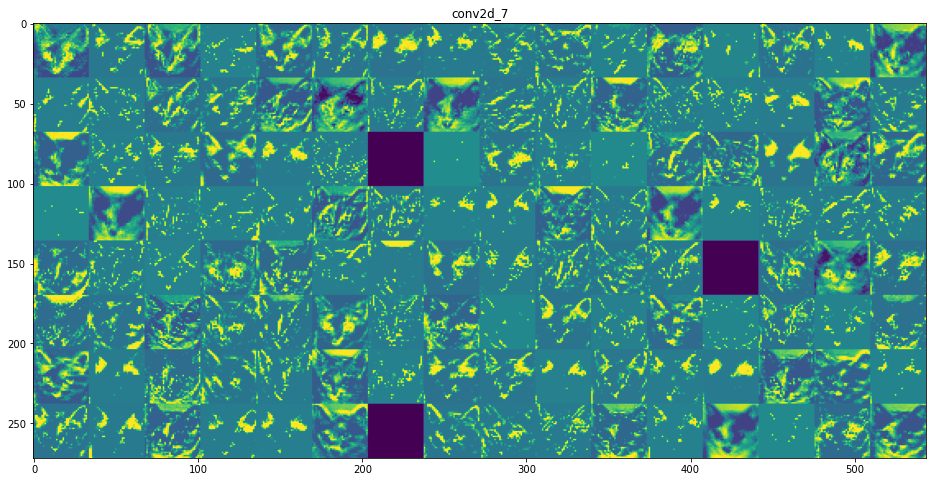

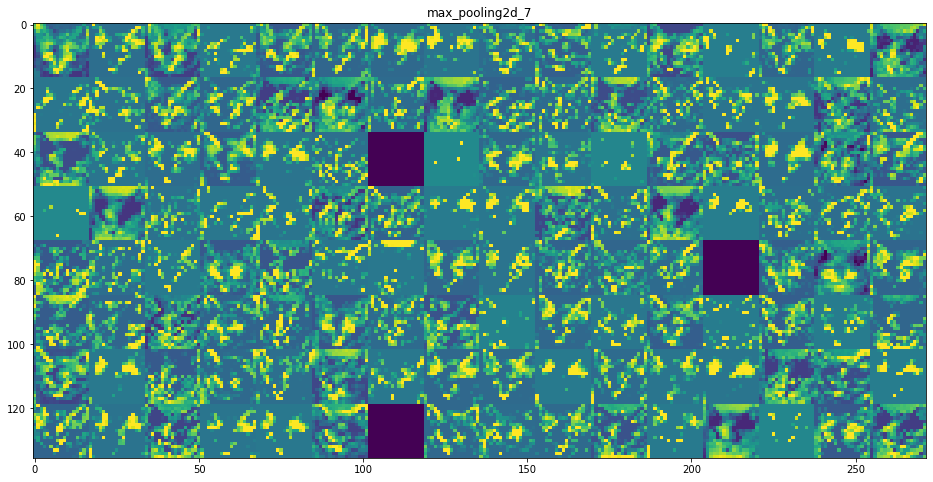

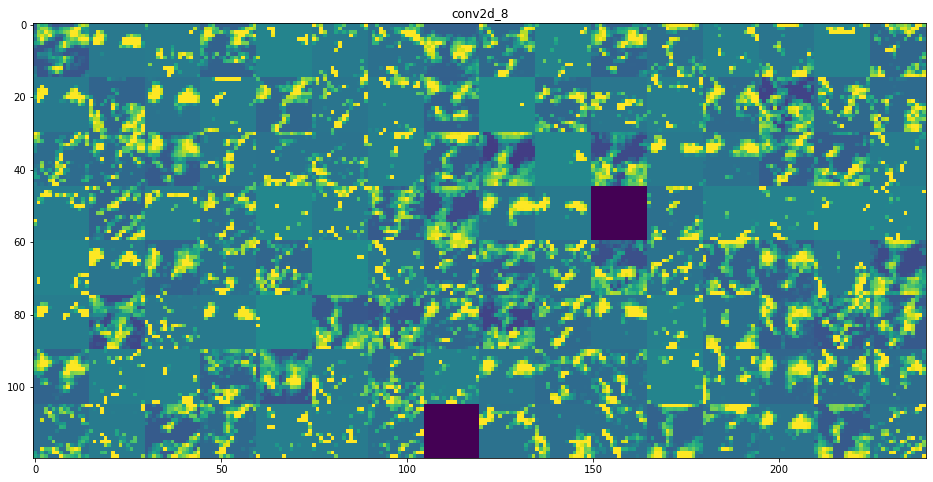

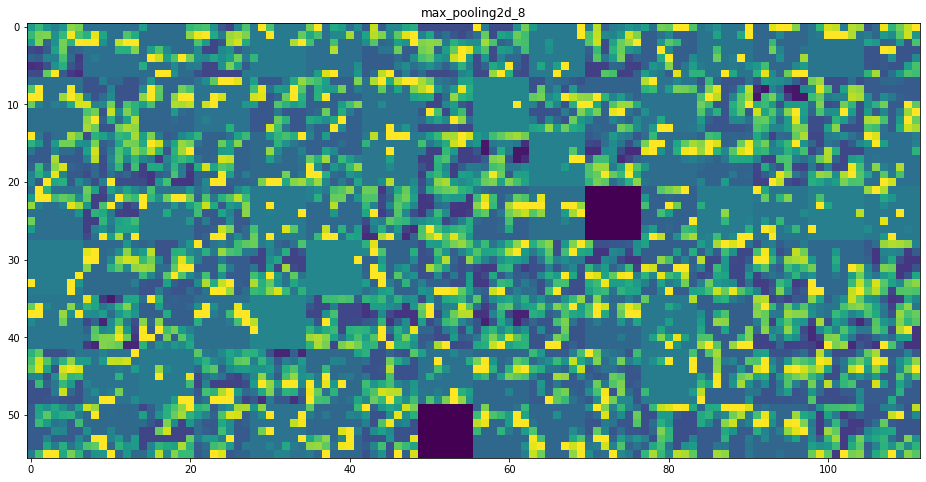

In [51]:
layer_names = []

for layer in model.layers[:8]:
    layer_names.append(layer.name)
    
images_per_row = 16

for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
            :, :,
            col * images_per_row + row]
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
            row * size : (row + 1) * size] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
    scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

# 2)  Visualizing convnet filters
- displays the visual pattern that each filter is meant to respond to
- applying gradient descent to the value of the input image of a convnet so as to maximize the response of a specific filter, starting from a blank input image.
- The resulting input image will be one that the chosen filter is maximally responsive to.

The process: 
> 1. Import the pre-trained VGG16 model.
> 2. Define a loss function to maximize the activation of a given filter within a given layer. 
> 3. Calculate gradient ascent with regard to our filter’s activation loss

We will use the VGG16 pretrained network

In [87]:
from keras.applications import VGG16
from keras import backend as K
import os 
import shutil
os.environ['KMP_DUPLICATE_LIB_OK']='True'

model = VGG16(weights='imagenet',
    include_top=False)

model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_13 (InputLayer)        (None, None, None, 3)     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0     

### i) Import the pre-trained VGG16 model.
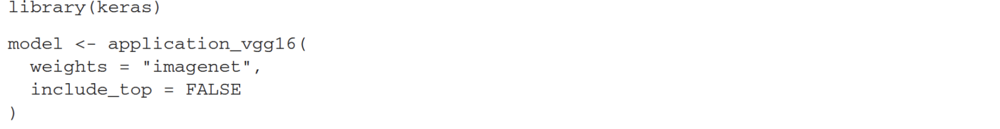

### ii) Build a loss function that maximizes the activation of the nth filter of the layer considered
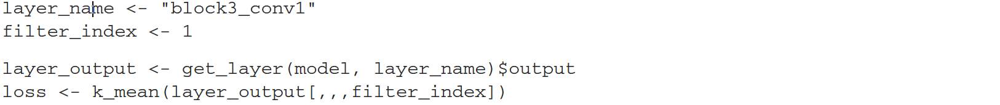

### iii) Compute the gradient of the input picture with this loss
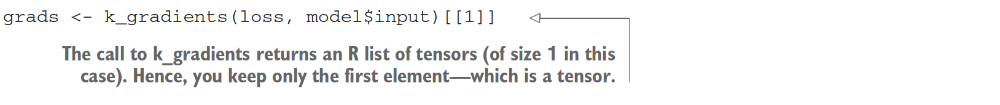

### iv) Start from a gray image with some random noise
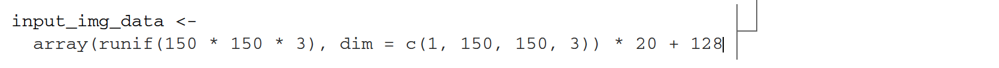

### v) Visualize your result (input)


In [133]:
from keras.applications import VGG16
from keras import backend as K
import os 
import shutil
os.environ['KMP_DUPLICATE_LIB_OK']='True'

model = VGG16(weights='imagenet',
    include_top=False)

layer_name = 'block1_conv1'

filter_index = 0
layer_output = model.get_layer(layer_name).output
loss = K.mean(layer_output[:, :, :, filter_index])

grads = K.gradients(loss, model.input)[0]

grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

iterate = K.function([model.input], [loss, grads])
import numpy as np
loss_value, grads_value = iterate([np.zeros((1, 150, 150, 3))])

input_img_data = np.random.random((1, 150, 150, 3)) * 20 + 128.
step = 1.
for i in range(40):
    loss_value, grads_value = iterate([input_img_data])
    input_img_data += grads_value * step
    
def deprocess_image(x):
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1
    x += 0.5
    x = np.clip(x, 0, 1)
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [134]:
def generate_pattern(layer_name, filter_index, size=150):
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])
    grads = K.gradients(loss, model.input)[0]
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)
    iterate = K.function([model.input], [loss, grads])
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.
    step = 1.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
        img = input_img_data[0]
        return deprocess_image(img)

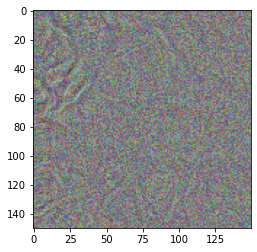

In [137]:
plt.imshow(generate_pattern('block5_conv1', 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


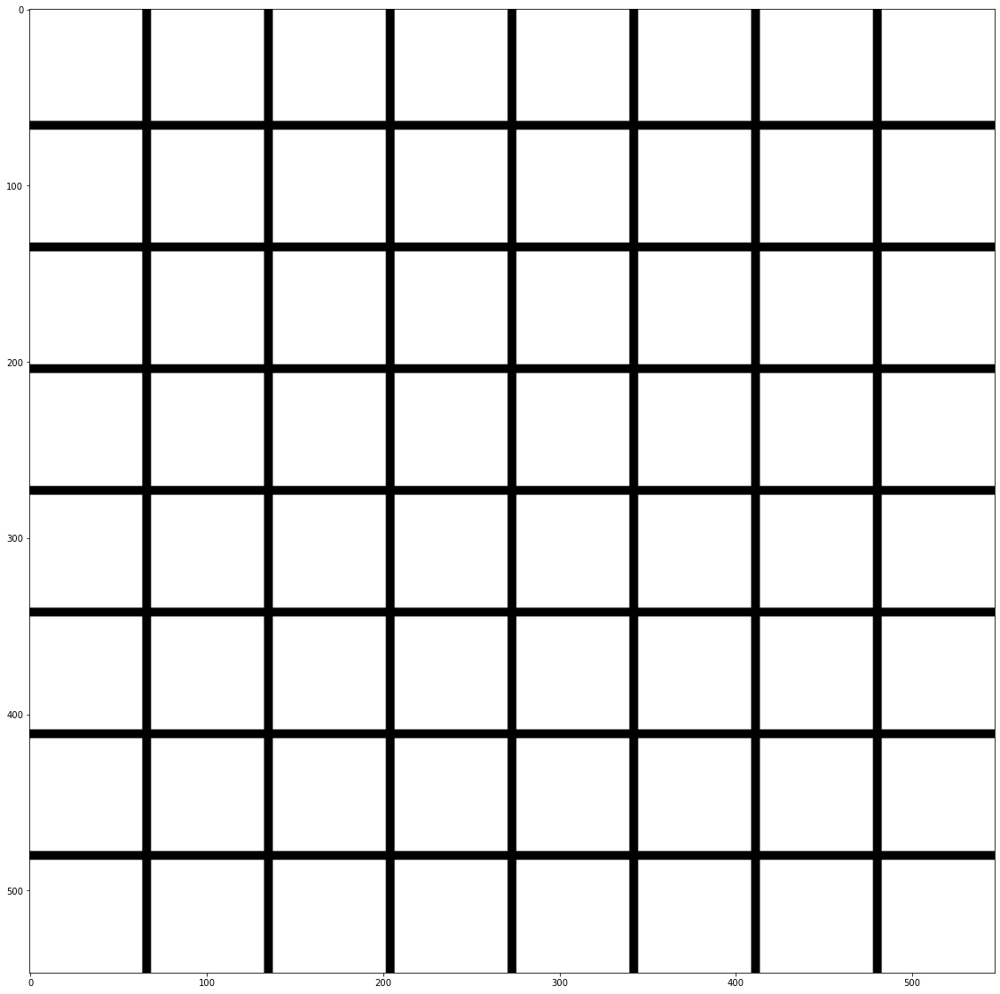

In [83]:
layer_name = 'block2_conv2'
size = 64
margin = 5
results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3))

for i in range(8):
    for j in range(8):
        filter_img = generate_pattern(layer_name, i + (j * 8), size=size)
        horizontal_start = i * size + i * margin
        horizontal_end = horizontal_start + size
        vertical_start = j * size + j * margin
        vertical_end = vertical_start + size
        results[horizontal_start: horizontal_end,
        vertical_start: vertical_end, :] = filter_img
plt.figure(figsize=(20, 20))
plt.imshow(results)

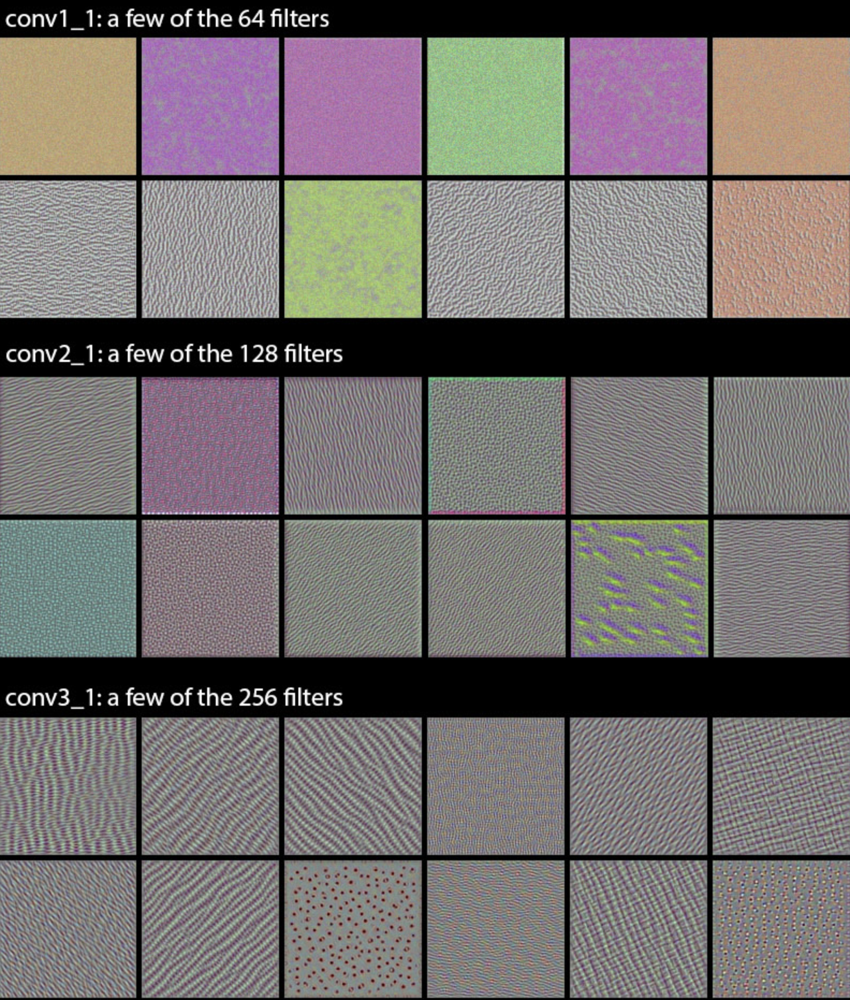
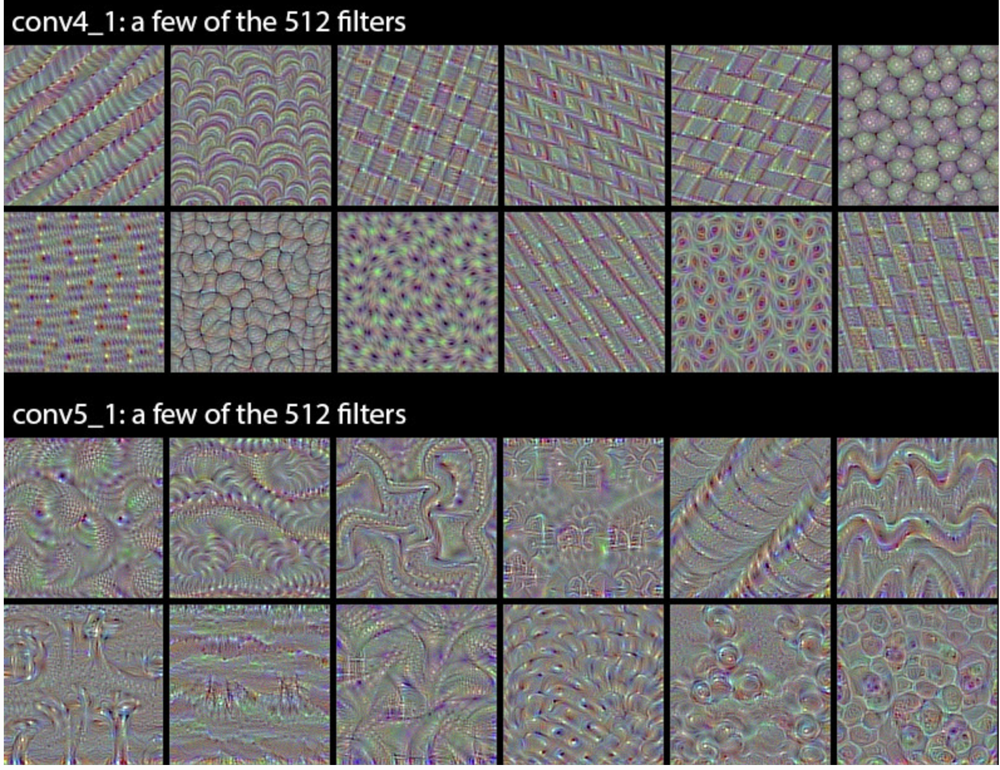

# 3. Visualizing heatmaps of class activation
 -  useful for understanding which parts of a given image led a convnet to its final classification decision.
 -  helpful for debugging the decision process of a convnet, particularly in the case of a classification mistake. 
 - It also allows you to locate specific objects in an image.
 
 #### Technique: Class Activation Map (CAM) visualization
 - consists of producing heatmaps of class activation over input images
 - heatmap is a 2D grid of scores associated with a specific output class, computed for every location in any input image, indicating how important each location is with respect to the class under consideration
 
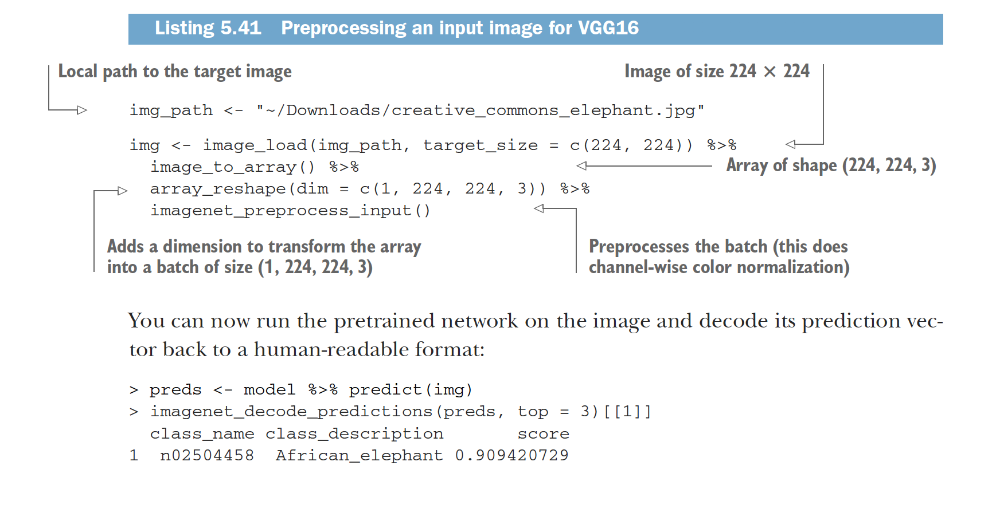

In [66]:
from keras.applications.vgg16 import VGG16
model = VGG16(weights='imagenet')
import os 

os.environ['KMP_DUPLICATE_LIB_OK']='True'


from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np
img_path = 'elephants.jpg'
img = image.load_img(img_path, target_size=(224, 224))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

preds = model.predict(x)


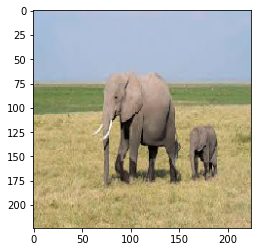

Predicted: [('n02504458', 'African_elephant', 0.82743835), ('n01871265', 'tusker', 0.15938061), ('n02504013', 'Indian_elephant', 0.013104385)]


In [67]:
plt.imshow(img)
plt.show()
print('Predicted:', decode_predictions(preds, top=3)[0])

## To visualize which parts of the image are the most 'African_elephant'–like


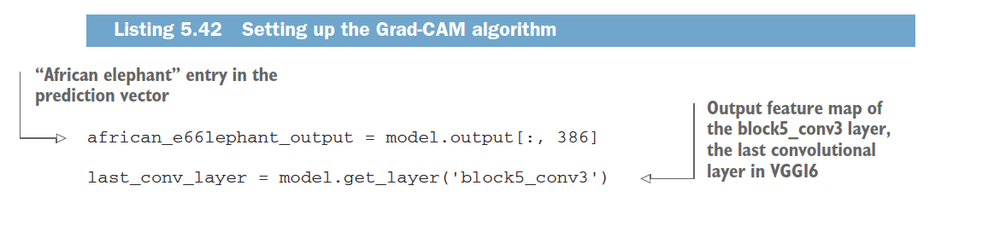
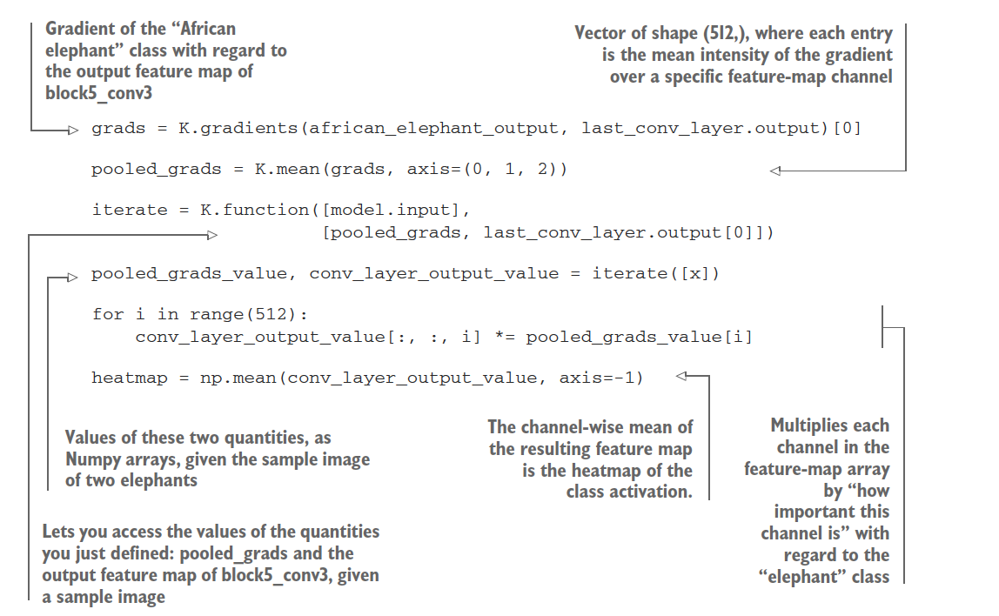

In [68]:
from keras import backend as K

african_elephant_output = model.output[:, 386]
last_conv_layer = model.get_layer('block5_conv3')

grads = K.gradients(african_elephant_output, last_conv_layer.output)[0]
pooled_grads = K.mean(grads, axis=(0, 1, 2))

iterate = K.function([model.input],
    [pooled_grads, last_conv_layer.output[0]])

pooled_grads_value, conv_layer_output_value = iterate([x])

for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]
    
heatmap = np.mean(conv_layer_output_value, axis=-1)

## Heatmap post-processing
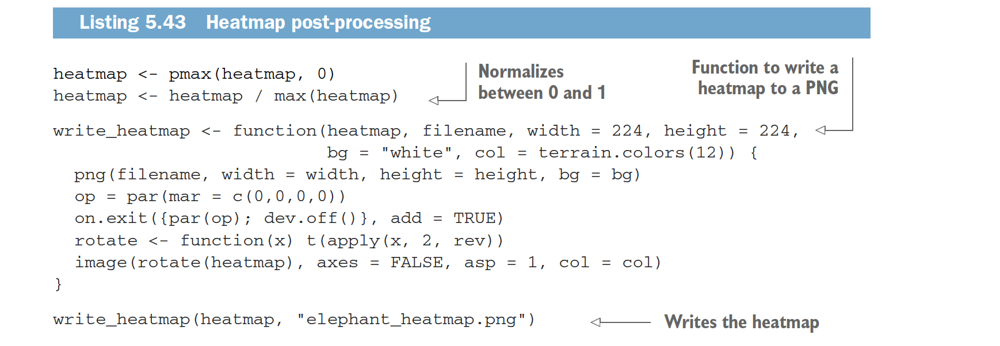

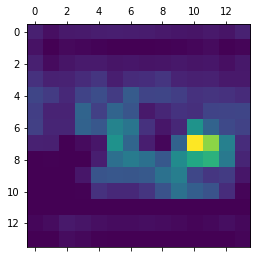

In [69]:
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)

##  Superimposing the heatmap with the original picture
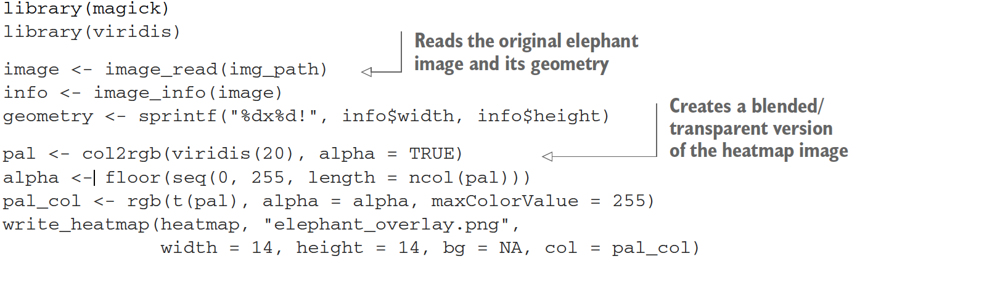

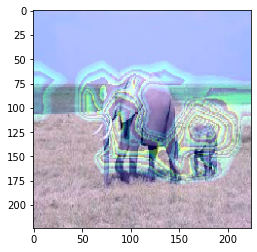

In [82]:
import cv2

img = cv2.imread(img_path)
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
superimposed_img = heatmap * 0.4 + img
cv2.imwrite('elephant_cam.jpg', superimposed_img)

img_path = 'elephant_cam.jpg'
img = image.load_img(img_path, target_size=(224, 224))
plt.imshow(img)
plt.show()